## <font style="font-family:roboto;color:#455e6c"> Exploratory Data Analysis with Python </font>  

Exploratory data analysis (EDA) refers to the process of performing initial investigations on data. Before performing any `Machine Learning` process it is very important to understand the data and EDA helps us to:
- Discover patterns in the data
- Spot anomalies in the data
- Test hypothesis
- Check assumptions with the help of summary statistics and graphical representations.

In this notebook we will use three different python libraries: 
1. [YData Profiling](https://docs.profiling.ydata.ai/latest/)
2. [Sweetviz](https://github.com/fbdesignpro/sweetviz)
3. [AutoViz](https://github.com/AutoViML/AutoViz)
   
to perform EDA of the famous [Iris](https://scikit-learn.org/stable/modules/generated/sklearn.datasets.load_iris.html) dataset from [scikit-learn](https://scikit-learn.org/stable/index.html)

### <font style="font-family:roboto;color:#455e6c"> Import necessary libraries </font>  

In [2]:
%matplotlib inline
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from ydata_profiling import ProfileReport
import sweetviz as sv
from autoviz import AutoViz_Class

### <font style="font-family:roboto;color:#455e6c"> Load the dataset </font>

Load the `iris` dataset from `scikit-learn` and convert in to a `pandas` data frame

In [3]:
dataset = load_iris()

In [4]:
# Check the feature names
dataset.feature_names

['sepal length (cm)',
 'sepal width (cm)',
 'petal length (cm)',
 'petal width (cm)']

In [5]:
# Check the target name
dataset.target_names

array(['setosa', 'versicolor', 'virginica'], dtype='<U10')

In [6]:
# Convert the dataset in to a pandas data frame
df = pd.DataFrame(data=np.concatenate([dataset.data, 
                                       dataset.target.reshape(-1,1)],
                                      axis=1),
                  columns=dataset.feature_names+["target"])
df["target"] = df["target"].astype(int)
df["target_names"] = pd.Categorical.from_codes(dataset.target, 
                                               dataset.target_names).astype(str)
df.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target,target_names
0,5.1,3.5,1.4,0.2,0,setosa
1,4.9,3.0,1.4,0.2,0,setosa
2,4.7,3.2,1.3,0.2,0,setosa
3,4.6,3.1,1.5,0.2,0,setosa
4,5.0,3.6,1.4,0.2,0,setosa


In [7]:
# Split the dataset in to train and test sets 
df_train, df_test = train_test_split(df, test_size=0.25)

### <font style="font-family:roboto;color:#455e6c"> Use pandas functionalities to explore the dataset </font>

Calling `describe()` command on the `pandas dataframe` will generate a descriptive statistics summary of the data

In [8]:
# Descriptive statistics summary of the dataset
df.describe()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target
count,150.000000,150.000000,150.000000,150.000000,150.000000
mean,5.843333,3.057333,3.758000,1.199333,1.000000
std,0.828066,0.435866,1.765298,0.762238,0.819232
min,4.300000,2.000000,1.000000,0.100000,0.000000
25%,5.100000,2.800000,1.600000,0.300000,0.000000
50%,5.800000,3.000000,4.350000,1.300000,1.000000
75%,6.400000,3.300000,5.100000,1.800000,2.000000
max,7.900000,4.400000,6.900000,2.500000,2.000000


### <font style="font-family:roboto;color:#455e6c"> First, we will use [seaborn](https://seaborn.pydata.org/index.html) library to make some statistical graphics </font>


In [9]:
%matplotlib inline

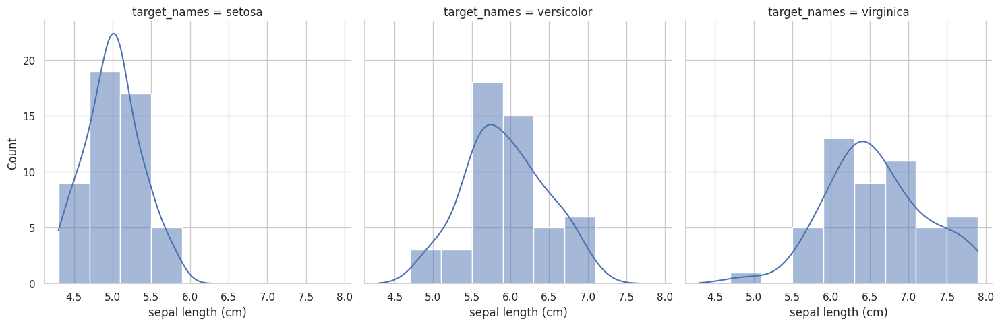

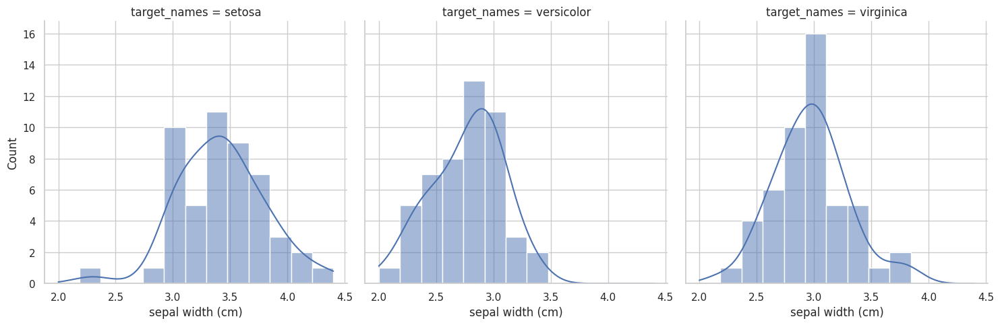

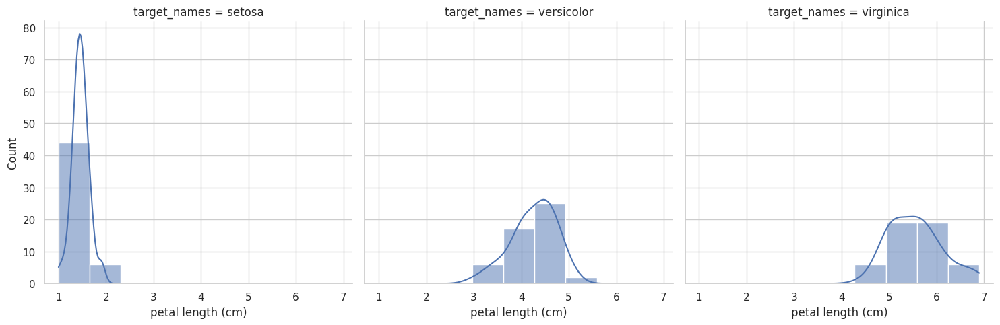

In [10]:
# Plot the distribution of variables in the dataset
# We are plotting only first three variables here
for c in df.columns[:3]:
    sns.displot(data=df, x=c, col="target_names", kde=True);

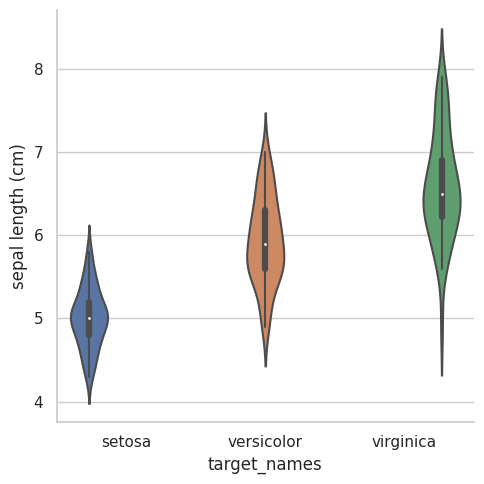

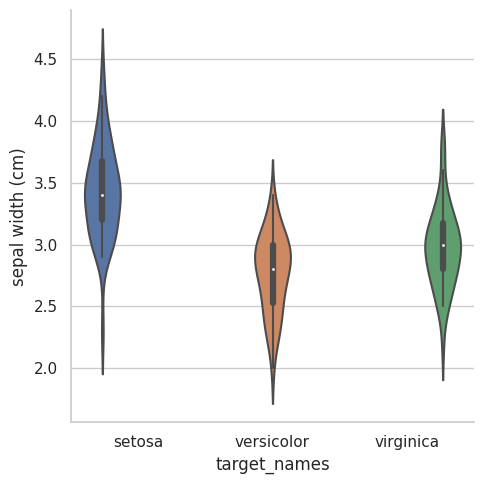

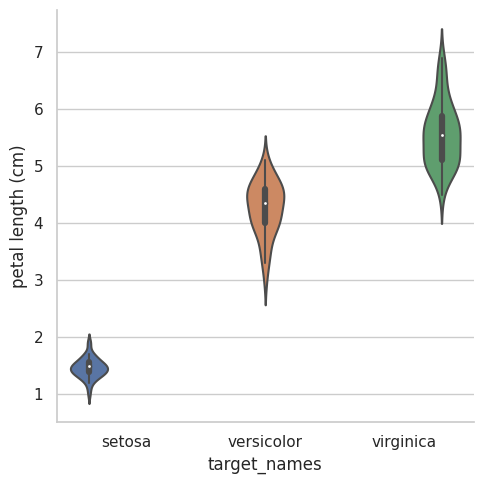

In [11]:
# Violin plot
# We are plotting only first three variables here
for c in df.columns[:3]:
    sns.catplot(data=df, kind="violin", x="target_names", y=c, hue="target_names", split=False)

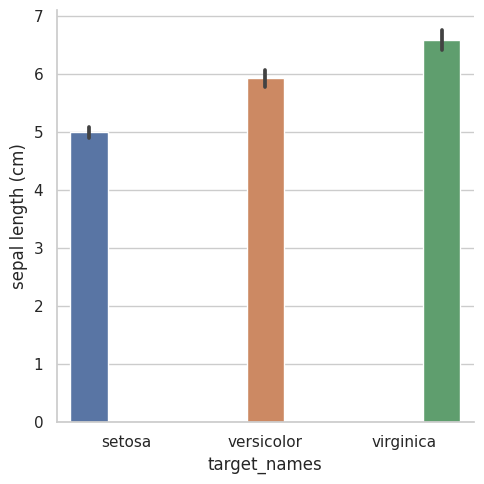

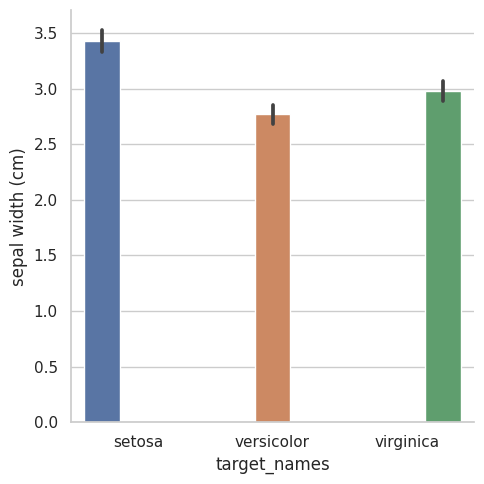

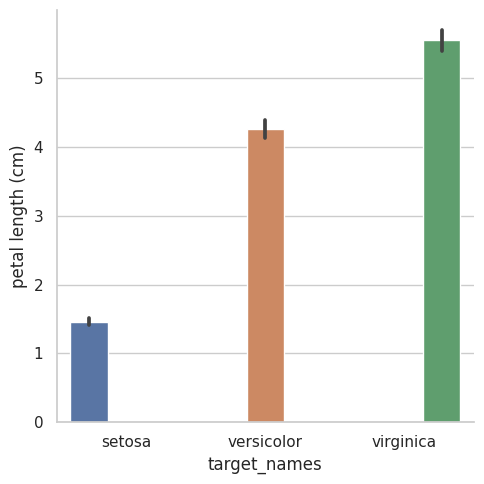

In [12]:
# Bar plot with confidence interval
# We are plotting only first three variables here
for c in df.columns[:3]:
    sns.catplot(data=df, kind="bar", x="target_names", y=c, hue="target_names");

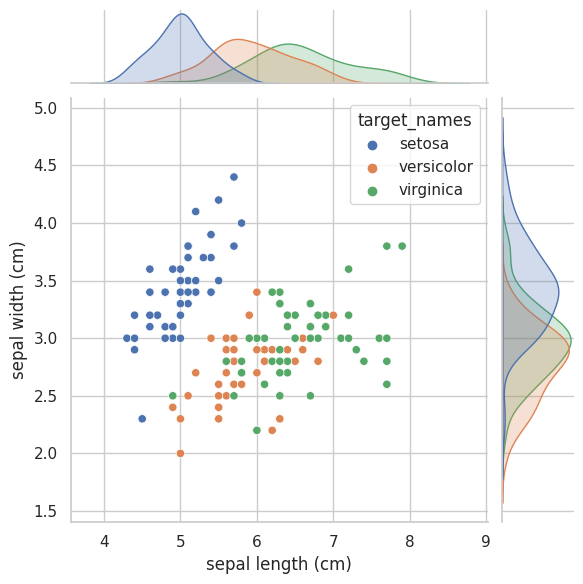

In [13]:
# Combine multiple kinds of plots to quickly give informative summaries 
sns.jointplot(data=df, x=df.columns[0], y=df.columns[1], hue="target_names");

CPU times: user 11.1 s, sys: 422 ms, total: 11.5 s
Wall time: 11.7 s


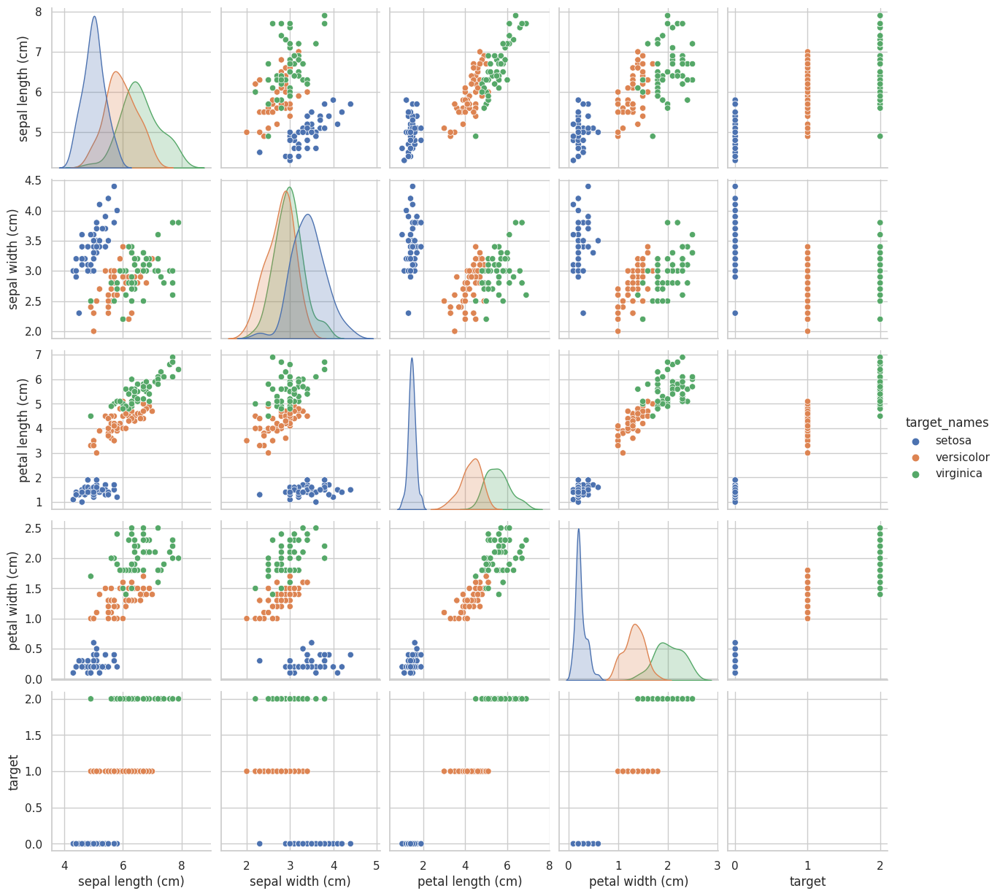

In [14]:
%%time
# Plotting only first 5 columns in the data frame
sns.pairplot(df, vars=df.columns[:5], hue='target_names', size=2.5);

### <font style="font-family:roboto;color:#455e6c"> EDA with YData Profiling </font>

Now, we will use [ydata_profiling](https://docs.profiling.ydata.ai/latest/) to automate and standardize the generation of detailed data profiling reports.

In [15]:
%%time
profile_report = ProfileReport(df, title="Profiling Report", explorative=True)

CPU times: user 15.6 ms, sys: 0 ns, total: 15.6 ms
Wall time: 27.1 ms


Once, the profile is complete we can save the report in to a `.html` file and share with other easily

In [16]:
%%time
# Save profile repot as html file
profile_report.to_file("profile_report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

CPU times: user 21.4 s, sys: 11.5 s, total: 32.9 s
Wall time: 16.9 s


In [17]:
%%time
# Display profiling report inside the jupyter notebook through an embedded HTML report
profile_report.to_notebook_iframe()

CPU times: user 62.5 ms, sys: 0 ns, total: 62.5 ms
Wall time: 61.9 ms


In [18]:
%%time
# Display profiling report inside the jupyter notebook through widgets
profile_report.to_widgets()

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

,petal length (cm),petal width (cm),sepal length (cm),sepal width (cm),target,target_names
petal length (cm),1.000000,0.937667,0.881898,-0.309635,0.890446,0.890446
petal width (cm),0.937667,1.000000,0.834289,-0.289032,0.924266,0.924266
sepal length (cm),0.881898,0.834289,1.000000,-0.166778,0.617390,0.617390
sepal width (cm),-0.309635,-0.289032,-0.166778,1.000000,0.445572,0.445572
target,0.890446,0.924266,0.617390,0.445572,1.000000,1.000000
target_names,0.890446,0.924266,0.617390,0.445572,1.000000,1.000000


CPU times: user 5.75 s, sys: 688 ms, total: 6.44 s
Wall time: 7.12 s


In [19]:
# Comparing two data sets
train_report = ProfileReport(df_train, title="Train")
test_report = ProfileReport(df_test, title="Test")
comparison_report = train_report.compare(test_report)
comparison_report.to_file("comparison.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [20]:
# Display comparison report inside the jupyter notebook through an embedded HTML report
comparison_report.to_notebook_iframe()

### <font style="font-family:roboto;color:#455e6c"> EDA with Sweetviz </font>

Next, we will use [sweetviz](https://github.com/fbdesignpro/sweetviz) to explore our data set

Analyze a single data set

In [21]:
# A single data set
feature_config = sv.FeatureConfig(force_num="target")
analyze_report = sv.analyze([df, "Iris"],
                            target_feat="target",
                            feat_cfg=feature_config)

                                             |                                              | [  0%]   00:00 -…


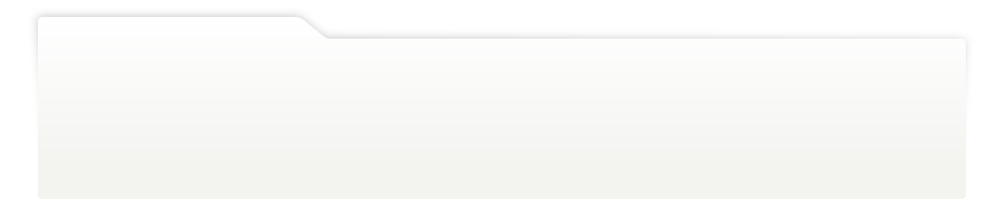
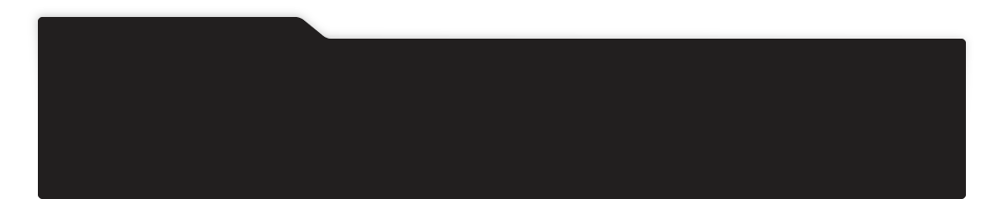
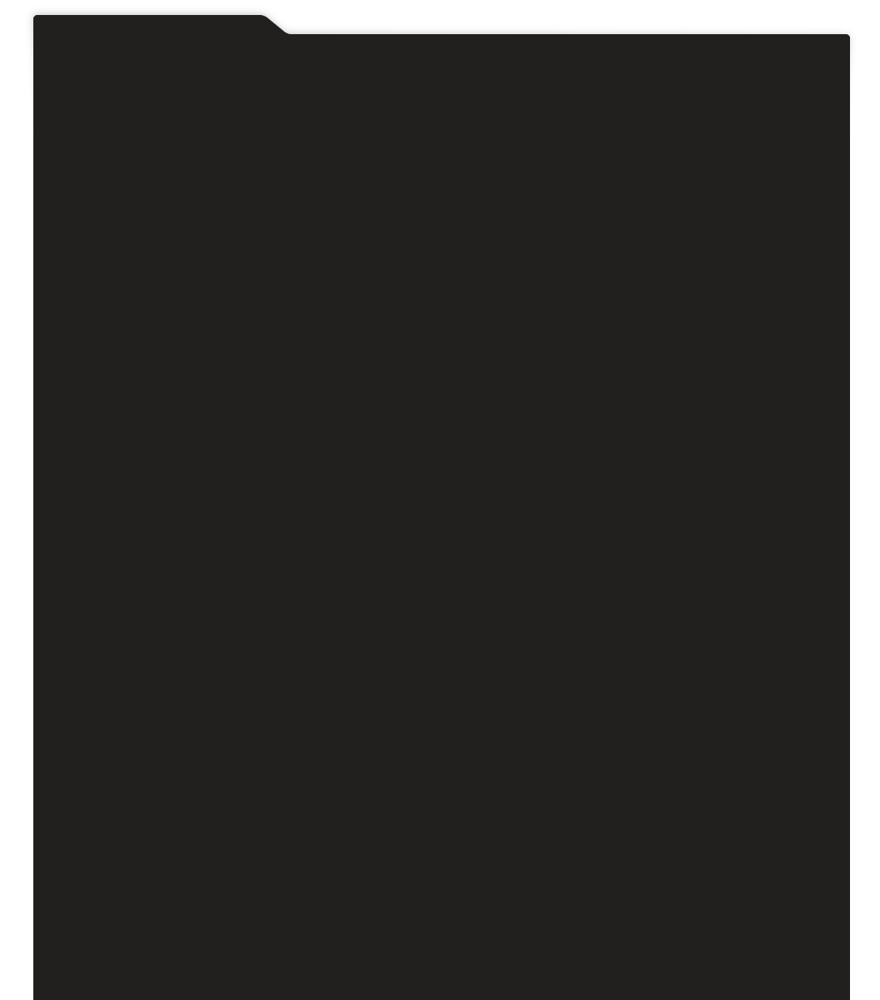
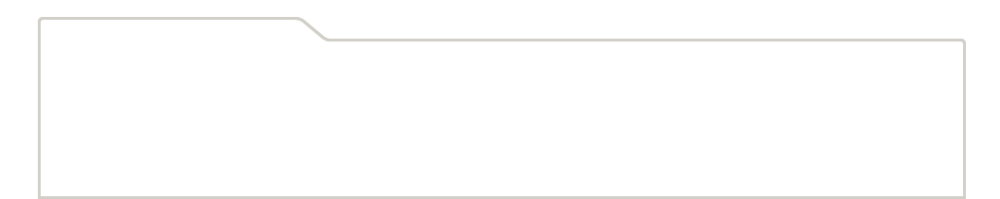
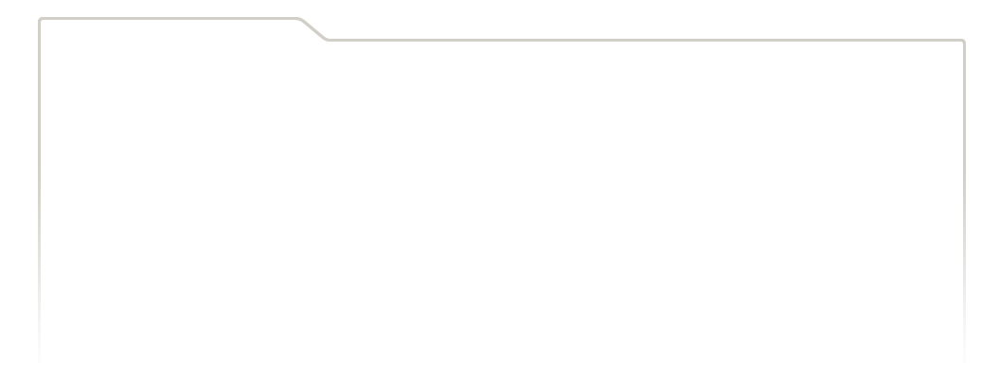
...
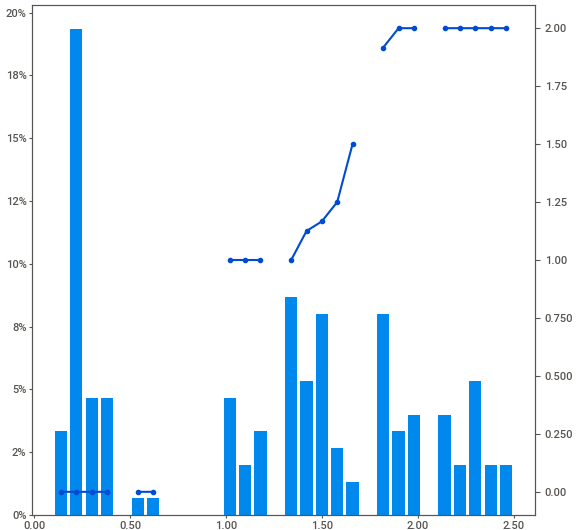
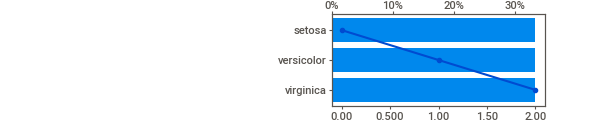
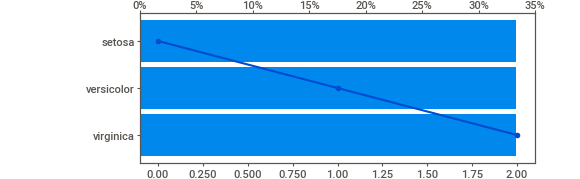
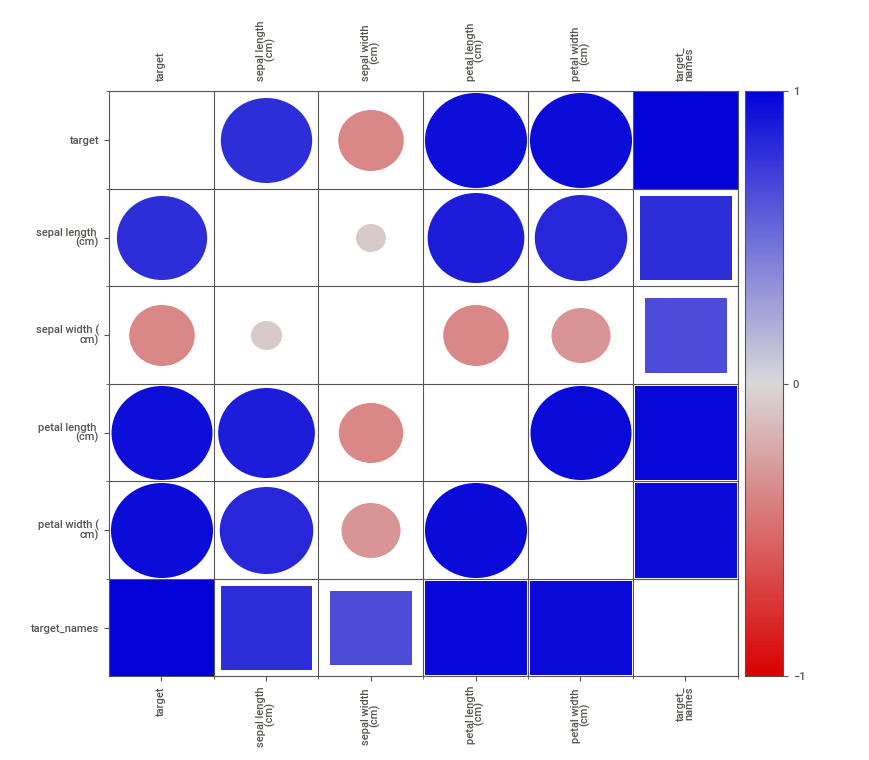
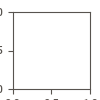

In [22]:
# Show analyze report for the single data set
analyze_report.show_notebook(layout='widescreen', w=1000, h=400, scale=0.5)

Compare two data sets

In [23]:
# Two data sets
feature_config = sv.FeatureConfig(force_num="target")
comparison_report = sv.compare([df_train,'Train'], 
                               [df_test,'Test'], 
                               target_feat="target",
                               feat_cfg=feature_config)

                                             |                                              | [  0%]   00:00 -…


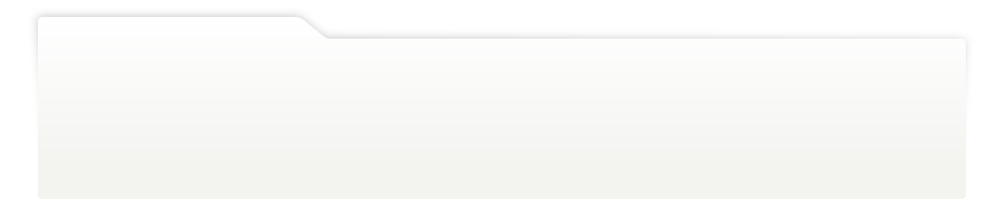
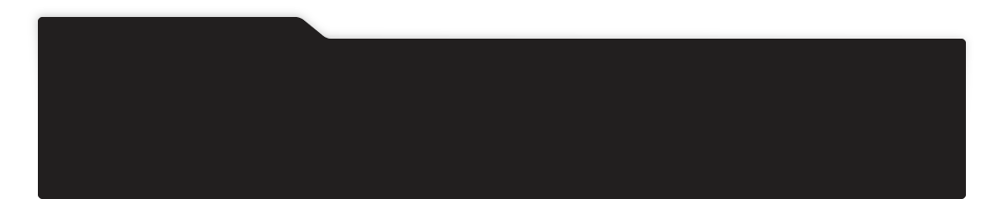
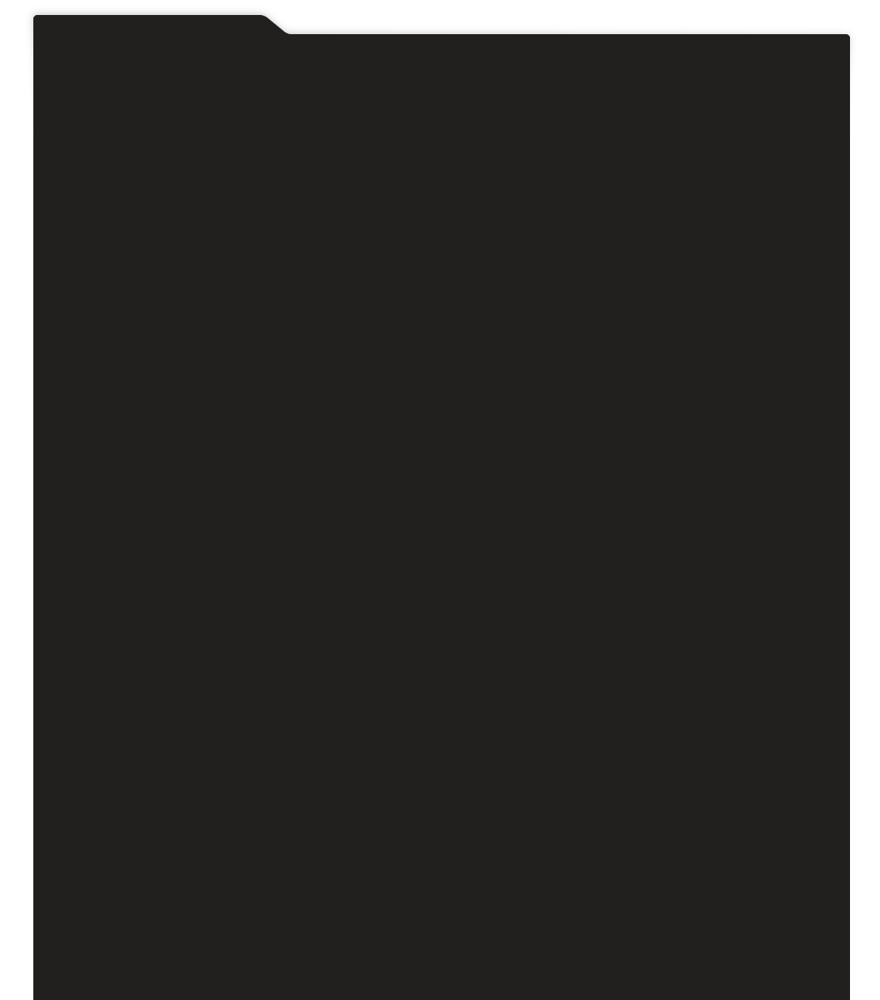
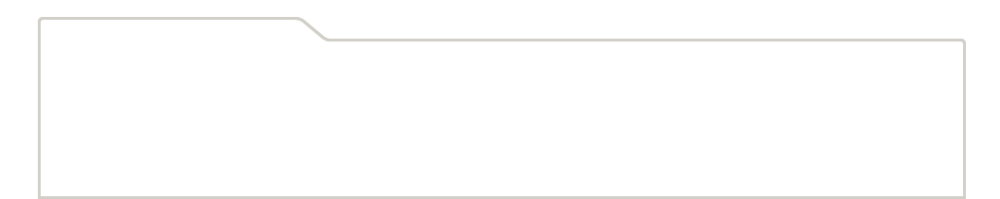
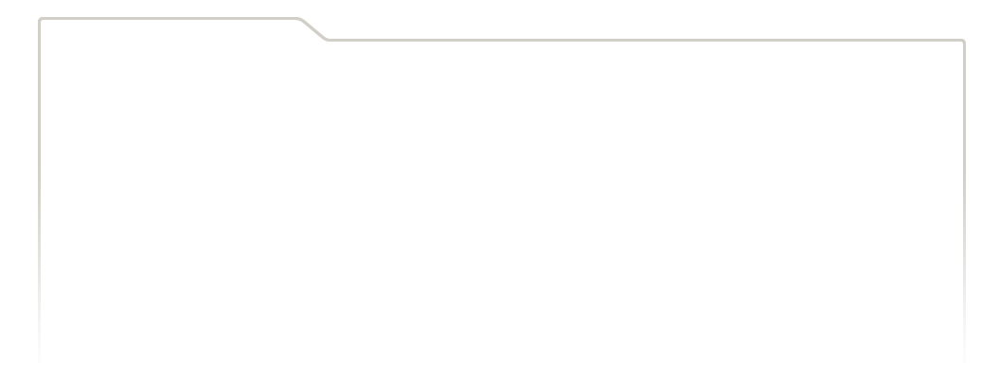
...
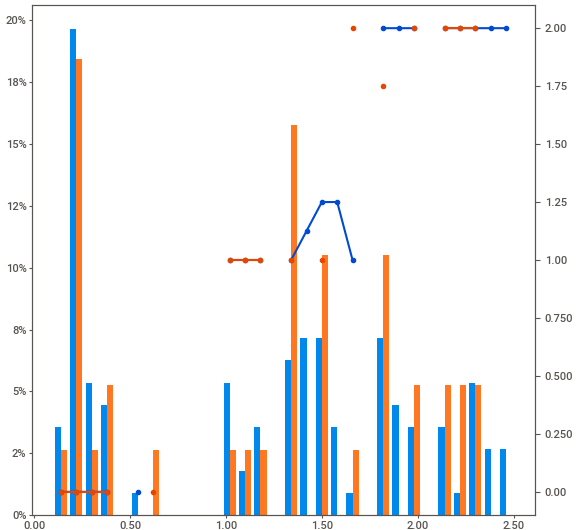
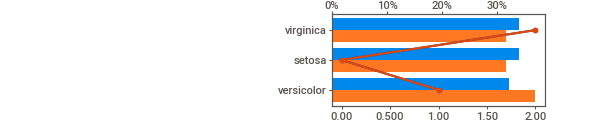
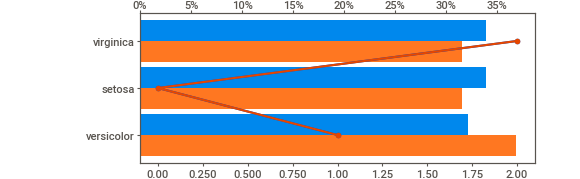
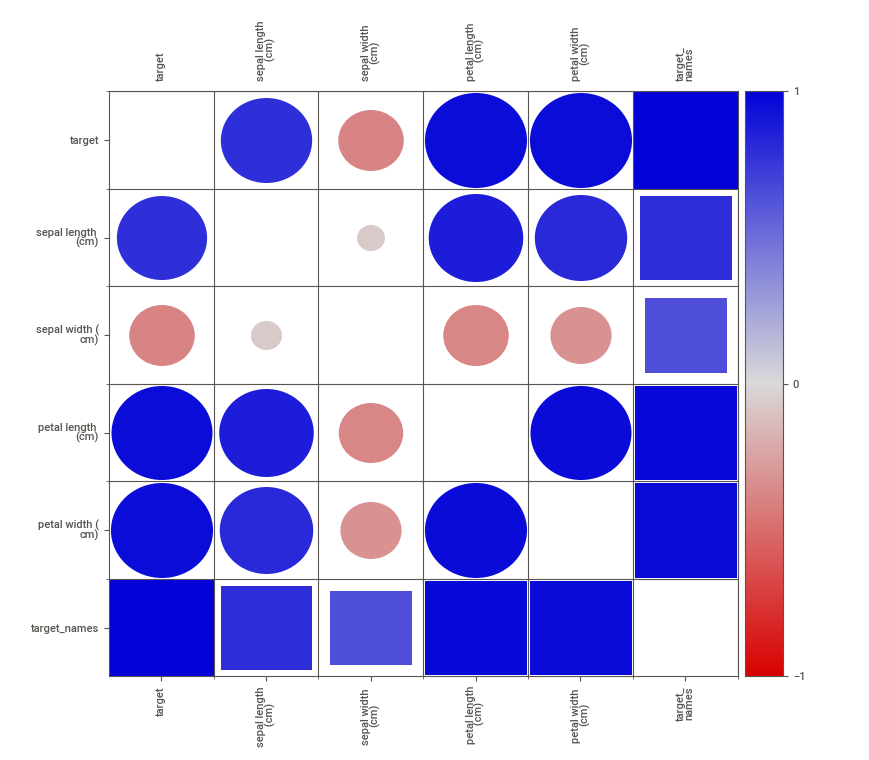
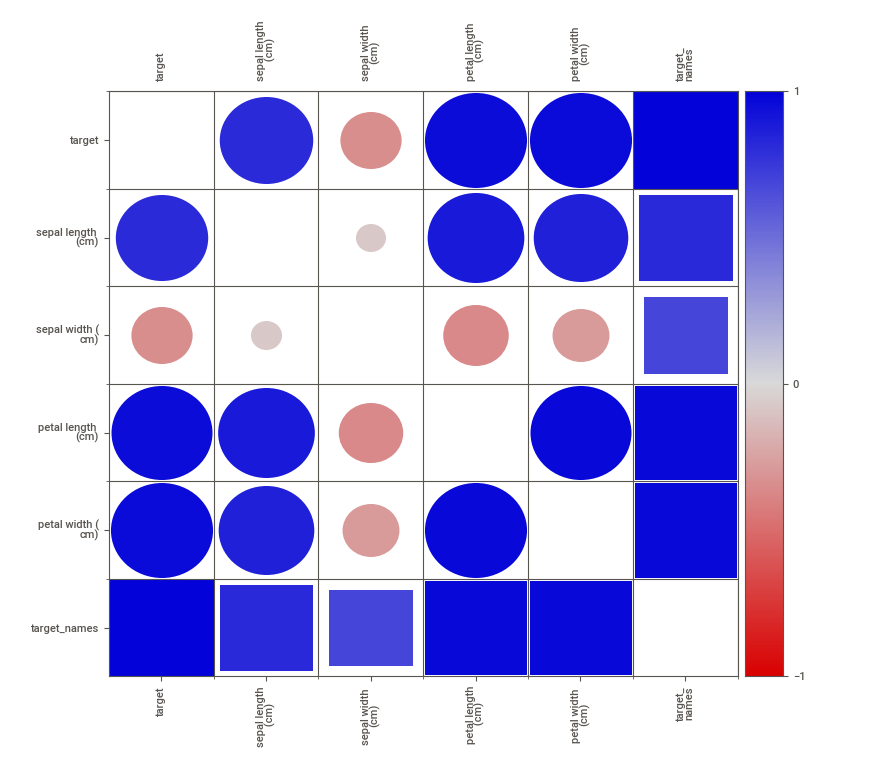

In [24]:
# Show comparison report for two data sets 
comparison_report.show_notebook(layout='widescreen', w=1000, h=400, scale=0.5)

To compare some populations within the same data set

In [25]:
# Comparing within the same data set
feature_config = sv.FeatureConfig(force_num="target")
intra_report = sv.compare_intra(df, df["target_names"] == "setosa", 
                                ["sepal length (cm)", "petal length (cm)"], 
                                "target", feature_config)

                                             |                                              | [  0%]   00:00 -…


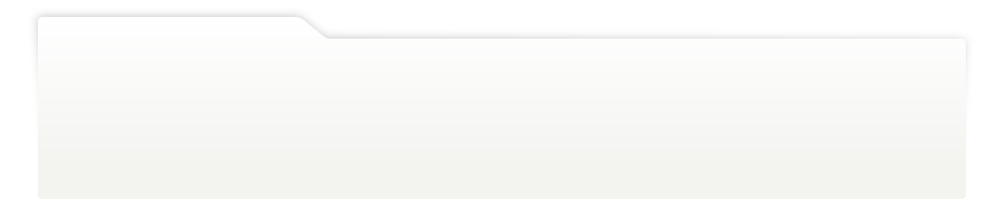
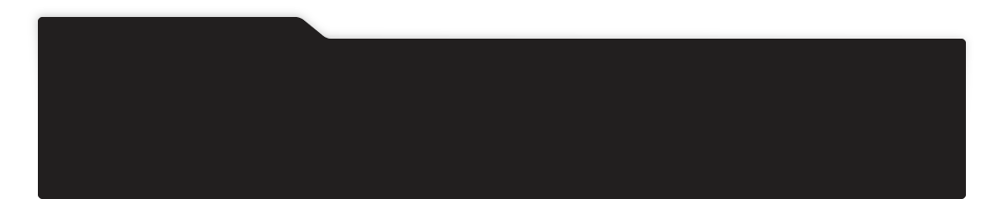
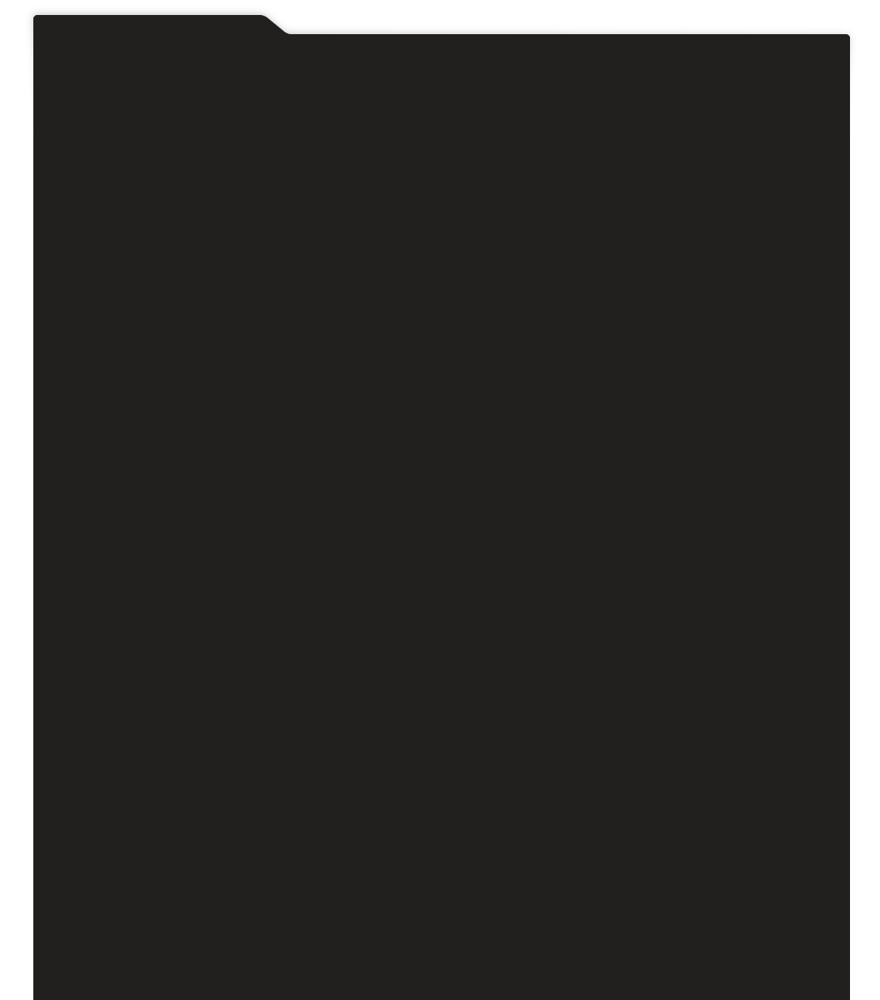
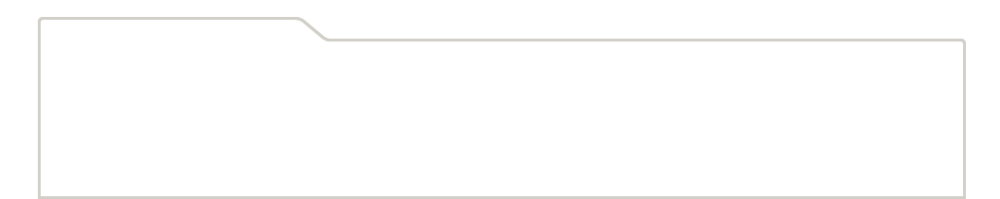
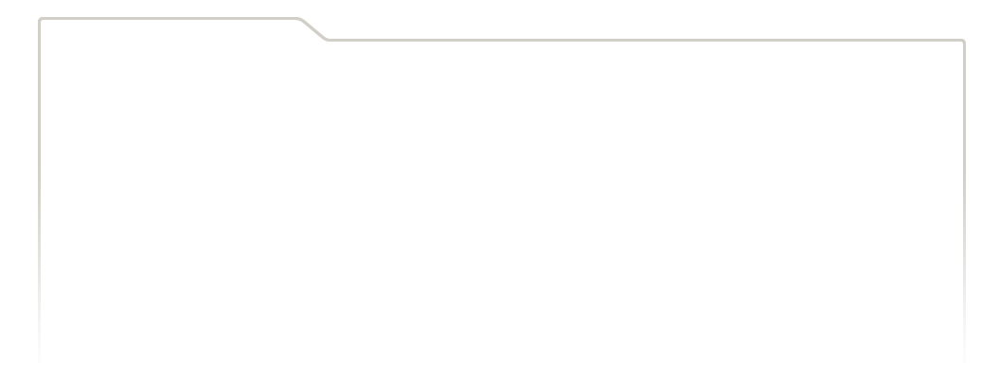
...
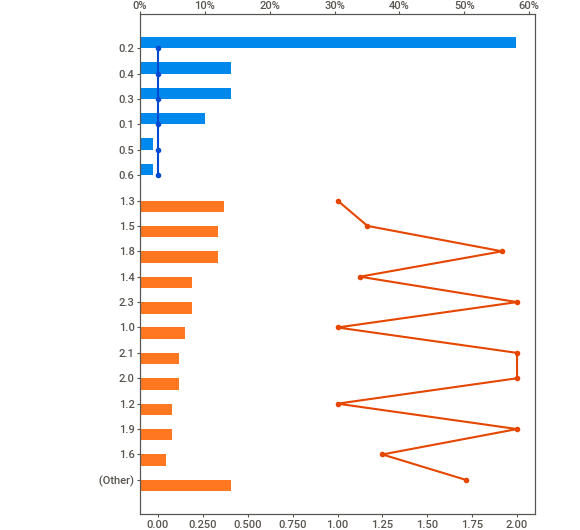
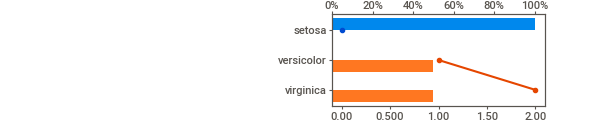
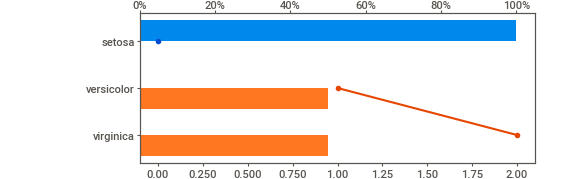
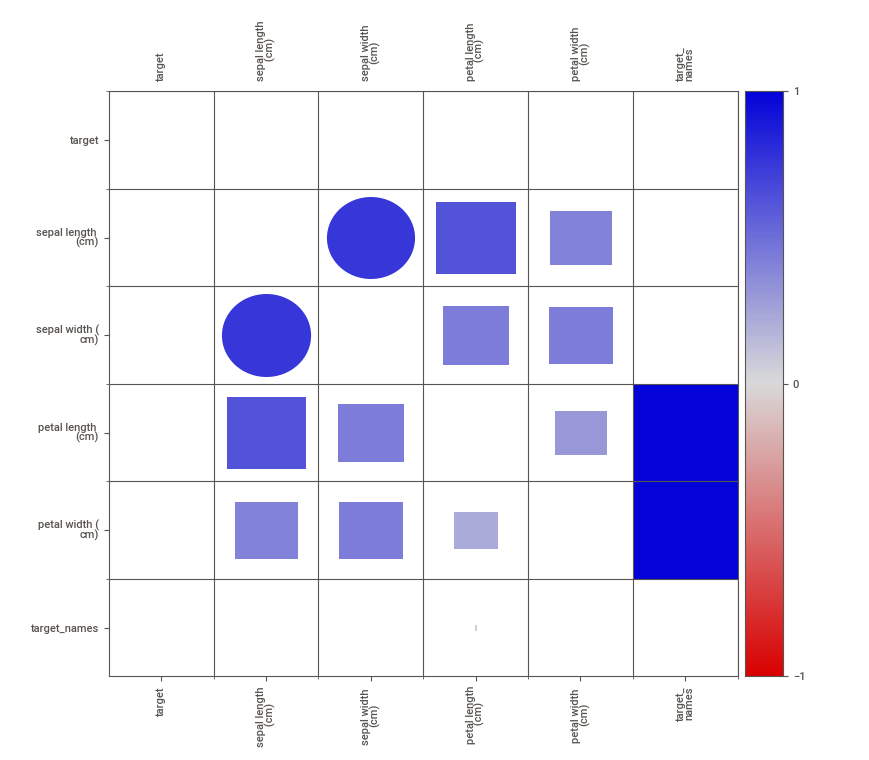
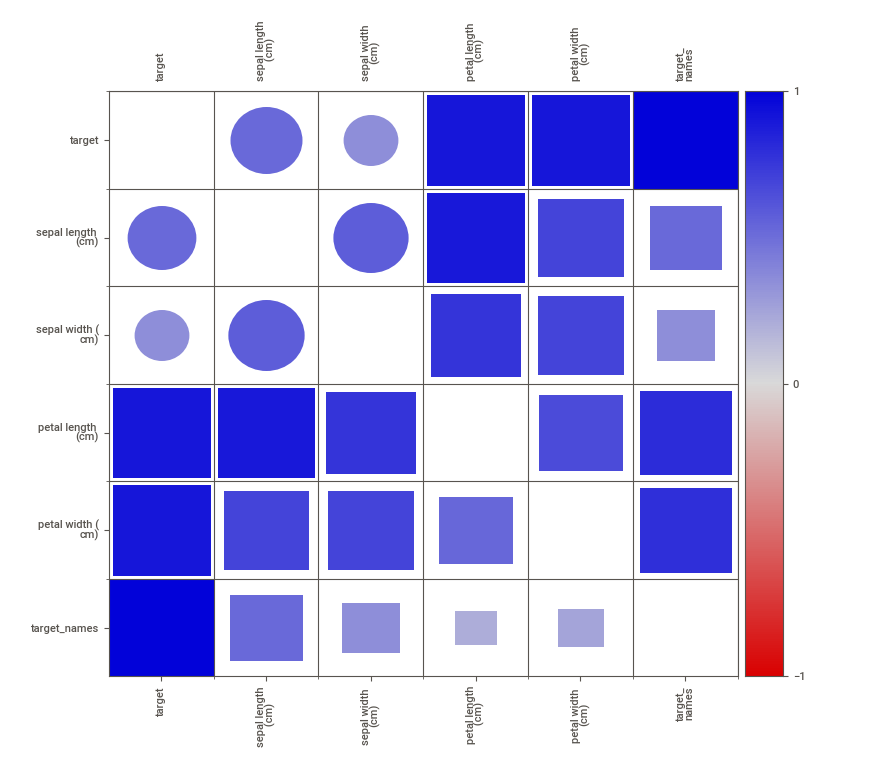

In [26]:
intra_report.show_notebook(w=900, h=450, scale=0.8)

### <font style="font-family:roboto;color:#455e6c"> EDA with AutoViz </font>

We will use [AutoViz](https://github.com/AutoViML/AutoViz) to generate insightful visualizations for our data

In [27]:
av = AutoViz_Class()

In [28]:
avt = av.AutoViz(
    "",
    sep=",",
    depVar="target_names",
    dfte=df,
    header=0,
    verbose=1,
    lowess=False,
    chart_format="bokeh",
    max_rows_analyzed=569,
    max_cols_analyzed=32,
    save_plot_dir="av"
)

Shape of your Data Set loaded: (150, 6)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  4
    Number of Integer-Categorical Columns =  1
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  0
    Number of Columns to Delete =  0
    5 Predictors classified...
        No variables removed since no ID or low-information variables found in data set

################ Multi_Classification problem #####################


Row
    [0] WidgetBox
        [0] Select(name='x', options=['target_names'], value='target_names')
        [1] Select(name='y', options=['sepal length (cm)', ...], value='sepal length (cm)')
    [1] ParamFunction(function, _pane=HoloViews)

Row
    [0] WidgetBox
        [0] Select(name='X-Axis', options=['sepal length (cm)', ...], value='sepal length (cm)')
        [1] Select(name='Y-Axis', options=['sepal length (cm)', ...], value='sepal width (cm)')
        [2] Select(name='Color', options=['None', 'target_names'], value='None')
    [1] ParamFunction(function, _pane=HoloViews)

Column
    [0] Row
        [0] HoloViews(DynamicMap, height=400, sizing_mode='fixed', width=600)
        [1] Column
            [0] WidgetBox
                [0] Select(margin=(20, 20, 20, 20), options=['target'], value='target', width=250)
            [1] VSpacer()

Column
    [0] Row
        [0] HoloViews(DynamicMap, height=400, sizing_mode='fixed', width=600)
        [1] Column
            [0] WidgetBox
                [0] Select(margin=(20, 20, 20, 20), options=['sepal width (cm)', ...], value='sepal width (cm)', width=250)
            [1] VSpacer()

HoloViews(DynamicMap)

HoloViews(Layout)

No date vars could be found in data set


HoloViews(Overlay, height=500, sizing_mode='fixed', width=600)

Row
    [0] WidgetBox
        [0] Select(name='X-Axis', options=['target', 'target_names']...], value='target')
        [1] Select(name='Y-Axis', options=['sepal length (cm)', ...], value='sepal length (cm)')
    [1] ParamFunction(function, _pane=HoloViews)

Time to run AutoViz (in seconds) = 11
